# Introduction

This is the analysis of gut intestinal stem cell data as presented in Böttcher et al. We use in total **76142** cells from **14 samples** in **6 conditions** (2 replicates in each mutant, 3 replicates in each control and 1 sample FVR only controls):

* Control (whole crypt)
* Control (FVR enriched)
* Control (FVR only)
* Mutant (Fltp deficient, whole crypt)
* Mutant (Fltp deficient, FVR enriched)
* Control (High fat diet project)

In this notebook, data are not batch effect corrected.

We filtered cells by

* number of reads
* number of detected genes
* fraction of mitochondrial reads (< 10%) 


## Tasks in this notebook

In order to keep the notebook structure short and well-arranged, we have split the gut intestinal stem cell analysis into several parts:

1. Pre-processing and filtering (thankfully done by Sophie)
2. Preparation of Batch effect correction
3. Data analysis with Graph abstraction (control only)
4. Pseudotime analysis of ISC-PC-EEC-Goblet lineage

This notebook covers **part 3**.

# Initialise scanpy

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as pl
import scanpy.api as sc
import matplotlib as mpl
import anndata
#import matplotlib.pyplot as plt
from matplotlib import rcParams

import scipy as sci
import os

sc.settings.verbosity = 3                # amount of output
sc.settings.set_figure_params(dpi=60, color_map='RdYlBu_r')
sc.logging.print_version_and_date()

Running Scanpy 1.3.1 on 2018-09-22 08:42.


## Load scanpy extensions

In [2]:
%run '~/Documents/Python/maren_codes/bar_frequency.py'
%run '~/Documents/Python/maren_codes/cal_density.py'
%run '~/Documents/Python/maren_codes/genes_to_xls.py'

# Load data

In [3]:
adata = sc.read('./write/gut_AB_AL_log_cor_combat_normed.h5')

In [4]:
adata

AnnData object with n_obs × n_vars = 74491 × 1999 
    obs: 'sample', 'percent_mito', 'percent_ribo', 'n_counts', 'n_genes', 'genetics'
    var: 'mean', 'dispersion'
    uns: 'neighbors', 'pca', 'sample_colors'
    obsm: 'X_pca', 'X_umap', 'X_tsne'
    varm: 'PCs'

In [5]:
pd.crosstab(adata.obs['sample'], adata.obs['genetics'])

genetics,control,mutant
sample,,
CD_1,4548,0
CD_2,4486,0
CD_3,4107,0
Control_1,3409,0
Control_2,2909,0
Control_3_FVR,3885,0
Control_4_FVR,4661,0
Control_5_FVR,8431,0
Control_6,6787,0


# Create clustering

In [6]:
sc.tl.louvain(adata)

running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished (0:00:06.20) --> found 18 clusters and added
    'louvain', the cluster labels (adata.obs, categorical)


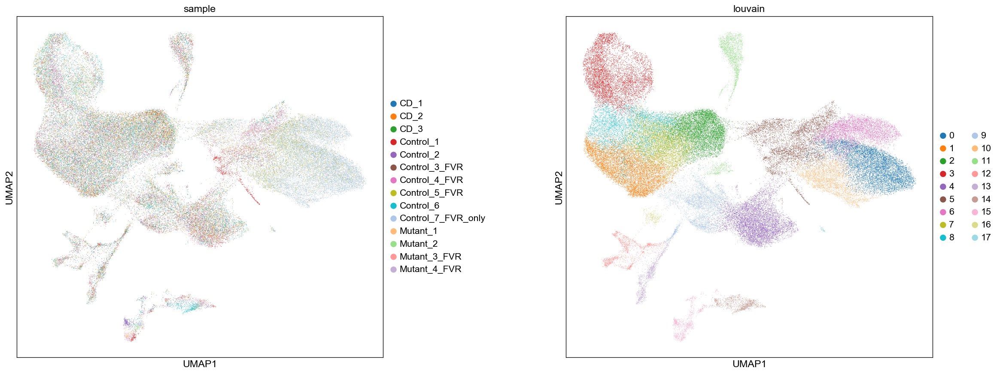

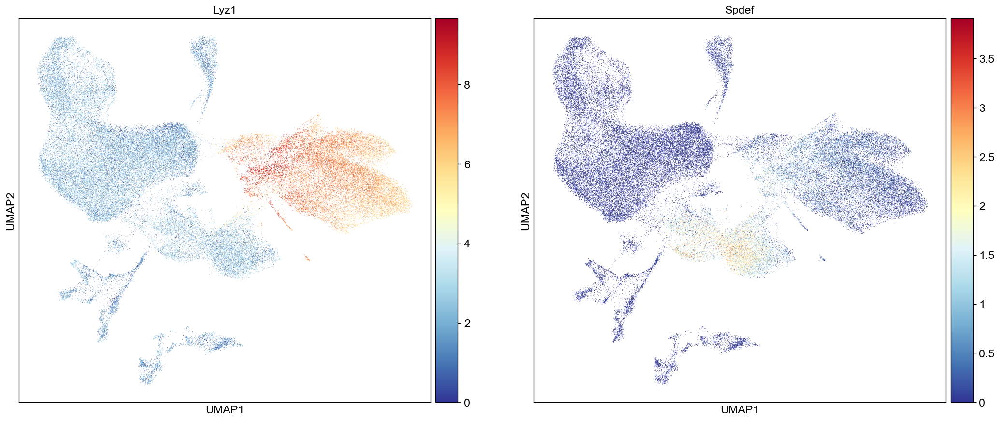

In [7]:
rcParams['figure.figsize']=(8,8)
sc.pl.umap(adata, color=['sample', 'louvain'])
sc.pl.umap(adata, color=['Lyz1', 'Spdef'])

## Annotate cell cycle

In [8]:
cc_gene_list= [x.strip() for x in open('./../../regev_lab_cell_cycle_genes_10X.txt')]

In [9]:
gene_exist = np.in1d(cc_gene_list, adata.var_names)

In [10]:
c = [cc_gene_list[i] for i in np.flatnonzero(gene_exist[:43])]
g2m = [cc_gene_list[i] for i in np.flatnonzero(gene_exist[43:])]

In [11]:
sc.tl.score_genes_cell_cycle(adata=adata, g2m_genes=g2m,s_genes=c)

calculating cell cycle phase
computing score 'S_score'
    finished (0:00:11.61) --> added
    'S_score', score of gene set (adata.obs)
computing score 'G2M_score'
    finished (0:00:17.18) --> added
    'G2M_score', score of gene set (adata.obs)
-->     'phase', cell cycle phase (adata.obs)


In [12]:
sc.write(adata=adata, filename='./write/gut_AB_AL_log_cor_combat_normed.h5')

## Reduce data to control samples

For the subsequent analysis, we exclude the mutant sample data.

In [13]:
adata_ctrl = adata[adata.obs['genetics']=='control']

In [14]:
adata_ctrl

View of AnnData object with n_obs × n_vars = 59964 × 1999 
    obs: 'sample', 'percent_mito', 'percent_ribo', 'n_counts', 'n_genes', 'genetics', 'louvain', 'S_score', 'G2M_score', 'phase'
    var: 'mean', 'dispersion'
    uns: 'neighbors', 'pca', 'sample_colors', 'louvain', 'louvain_colors'
    obsm: 'X_pca', 'X_umap', 'X_tsne'
    varm: 'PCs'

# Dimension reduction

We computed a possible clustering based on all genes. However, we re-compute the cluster annotation based on highly variable genes.

In [15]:
sc.tl.pca(adata_ctrl)

Note that scikit-learn's randomized PCA might not be exactly reproducible across different computational platforms. For exact reproducibility, choose `svd_solver='arpack'.` This will likely become the Scanpy default in the future.


In [16]:
sc.tl.tsne(adata_ctrl)

computing tSNE
    using 'X_pca' with n_pcs = 50
    using the 'MulticoreTSNE' package by Ulyanov (2017)
    finished (0:14:41.42) --> added
    'X_tsne', tSNE coordinates (adata.obsm)


In [17]:
sc.pp.neighbors(adata_ctrl)
sc.tl.umap(adata_ctrl)

computing neighbors
    using 'X_pca' with n_pcs = 50
    finished (0:00:30.98) --> added to `.uns['neighbors']`
    'distances', weighted adjacency matrix
    'connectivities', weighted adjacency matrix
computing UMAP
    finished (0:01:03.74) --> added
    'X_umap', UMAP coordinates (adata.obsm)


Plot louvain groups and cell cycle scoring (if they are available again).

... storing 'phase' as categorical


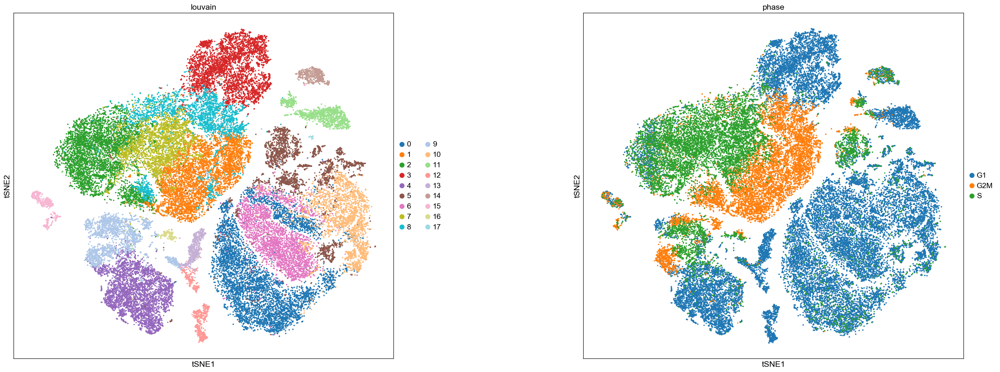

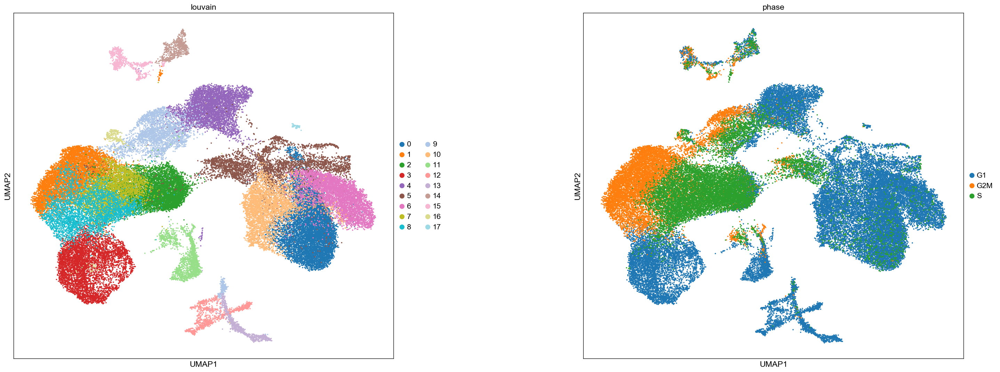

In [18]:
rcParams['figure.figsize']=(10,10)
sc.pl.tsne(adata_ctrl, color=['louvain','phase'], size=20)
sc.pl.umap(adata_ctrl, color=['louvain', 'phase'], size=20)

## Gene expression plots

We use the gene expression plot as first visual test to annotate clusters by cell type.

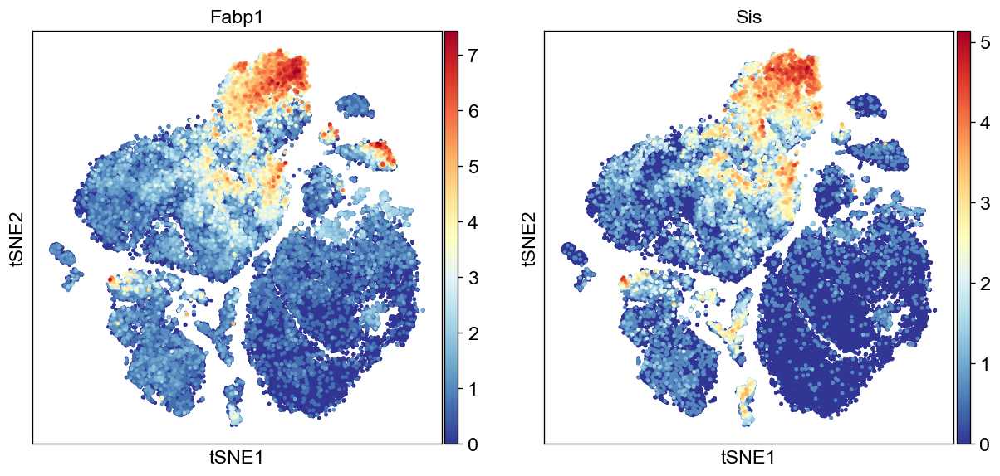

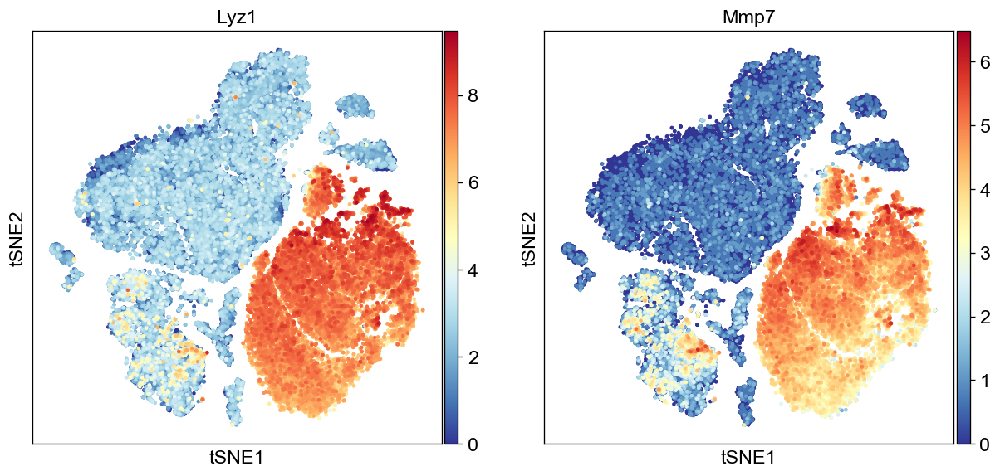

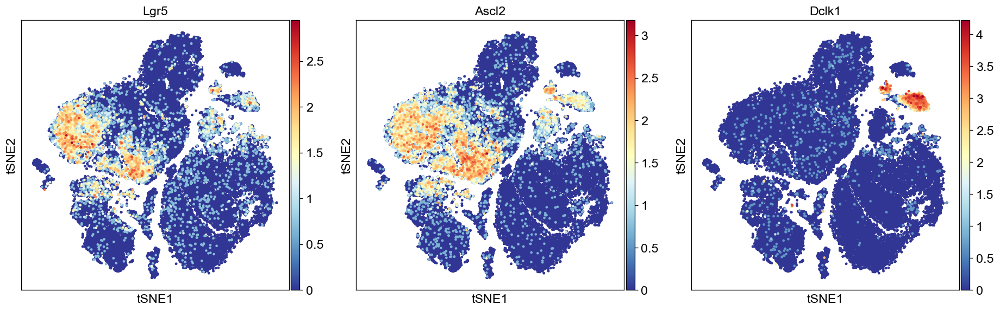

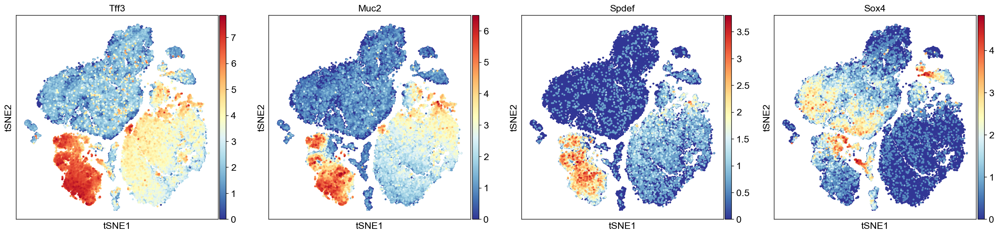

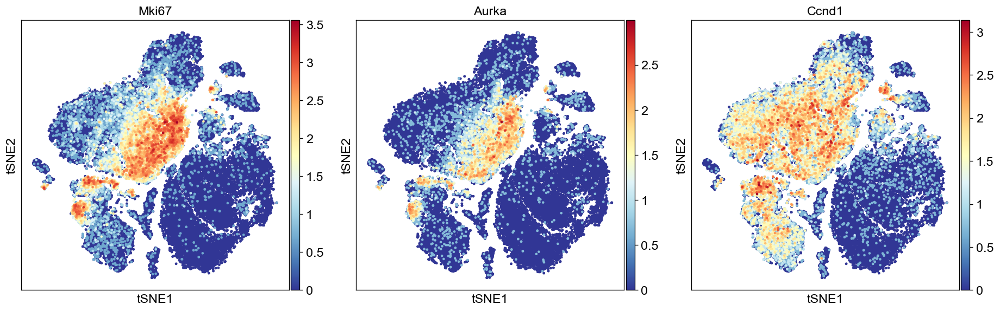

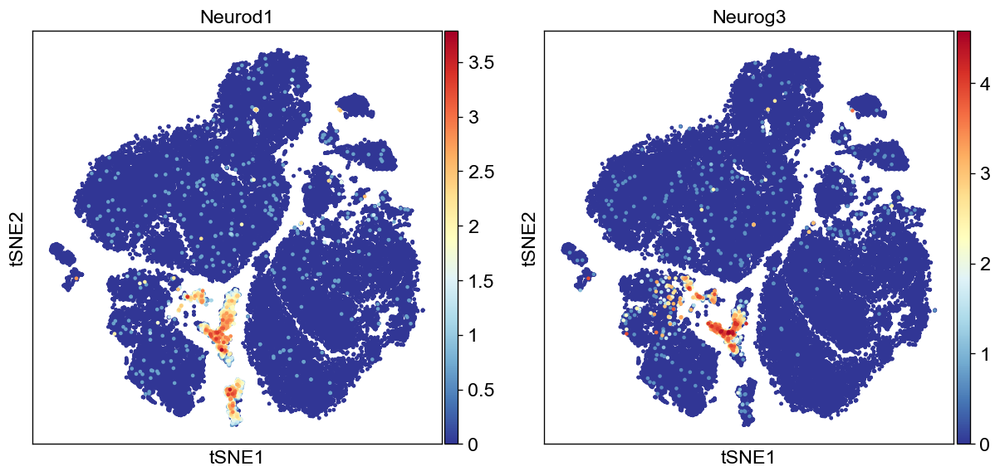

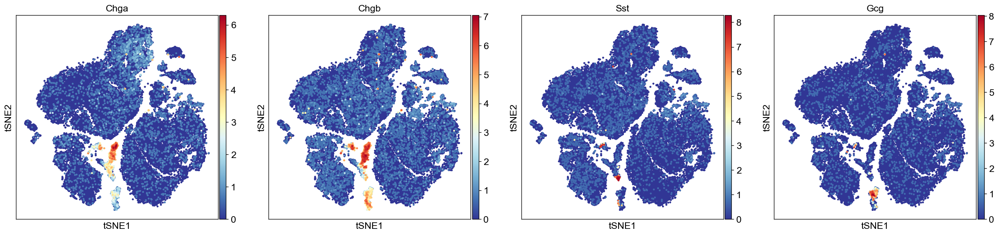

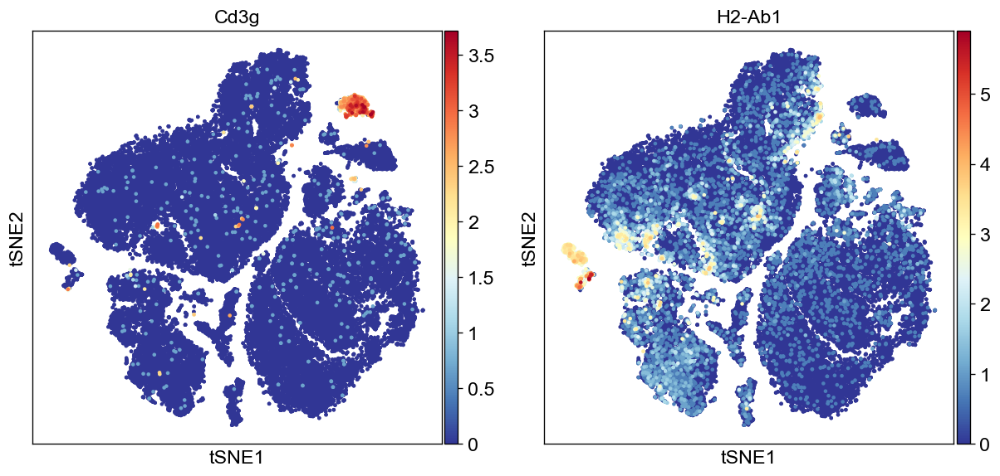

In [19]:
rcParams['figure.figsize']=(5,5)
sc.pl.tsne(adata_ctrl, color=['Fabp1', 'Sis'], size=30)
sc.pl.tsne(adata_ctrl, color=['Lyz1', 'Mmp7'], size=30)
sc.pl.tsne(adata_ctrl, color=['Lgr5', 'Ascl2', 'Dclk1'], size=30)
sc.pl.tsne(adata_ctrl, color=['Tff3', 'Muc2', 'Spdef', 'Sox4'], size=30)
sc.pl.tsne(adata_ctrl, color=['Mki67', 'Aurka', 'Ccnd1'], size=30)
sc.pl.tsne(adata_ctrl, color=['Neurod1', 'Neurog3'], size=30)
sc.pl.tsne(adata_ctrl, color=[ 'Chga', 'Chgb', 'Sst', 'Gcg'], size=30)
sc.pl.tsne(adata_ctrl, color=['Cd3g', 'H2-Ab1'], size=30)

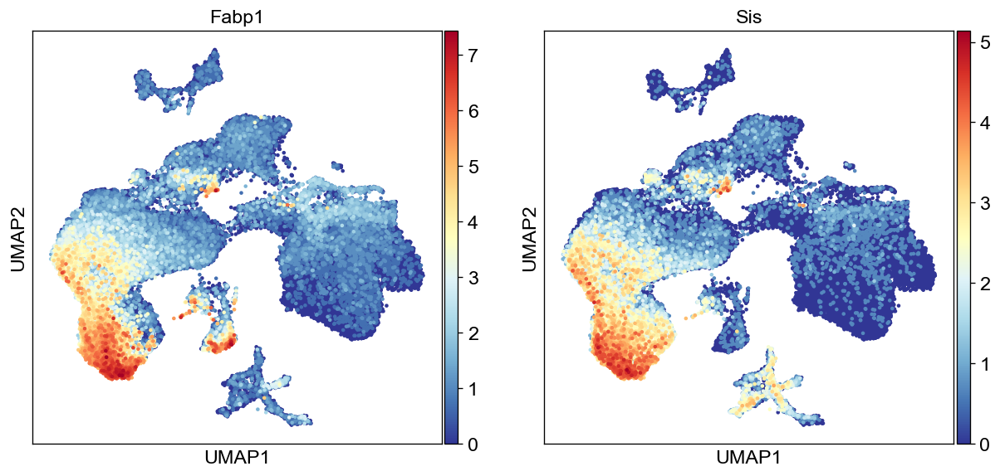

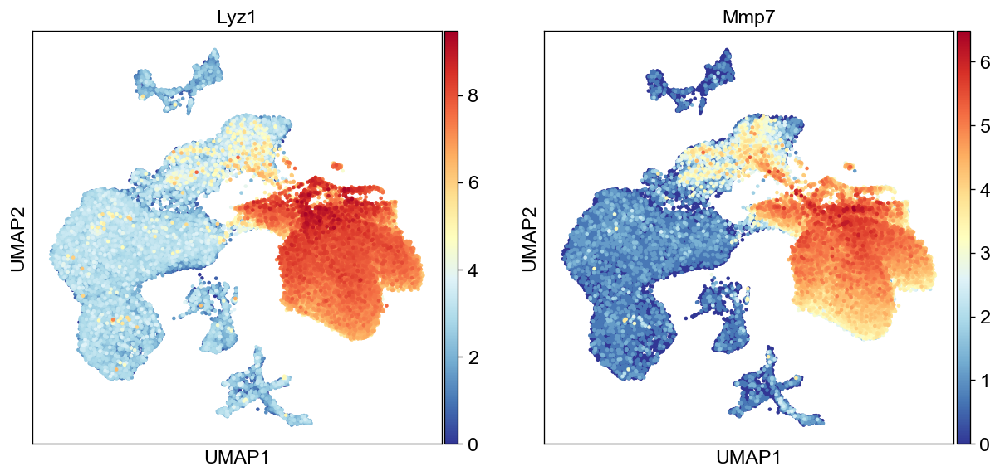

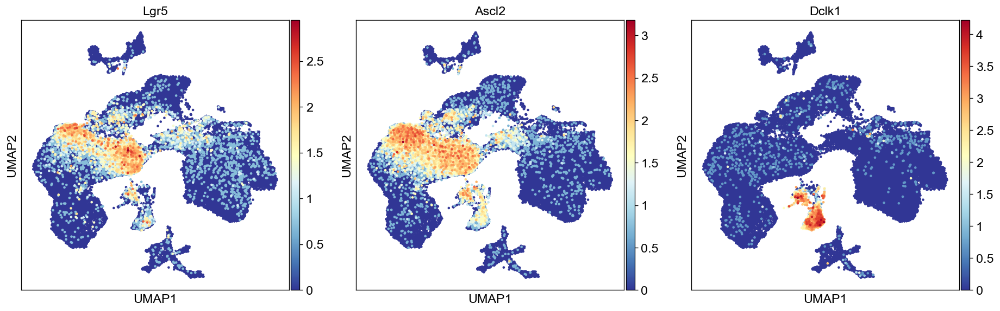

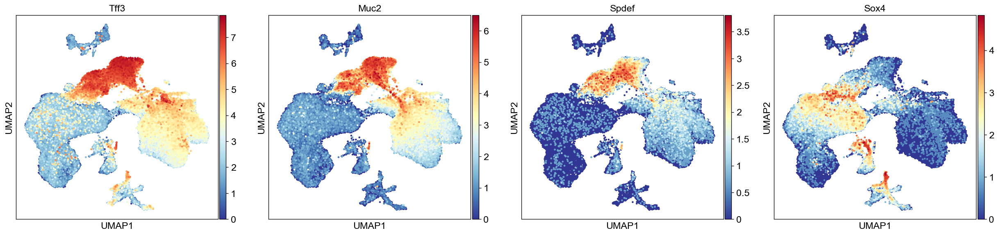

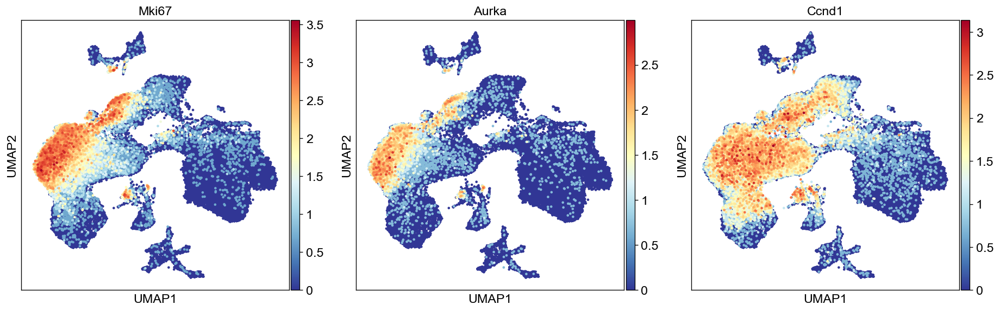

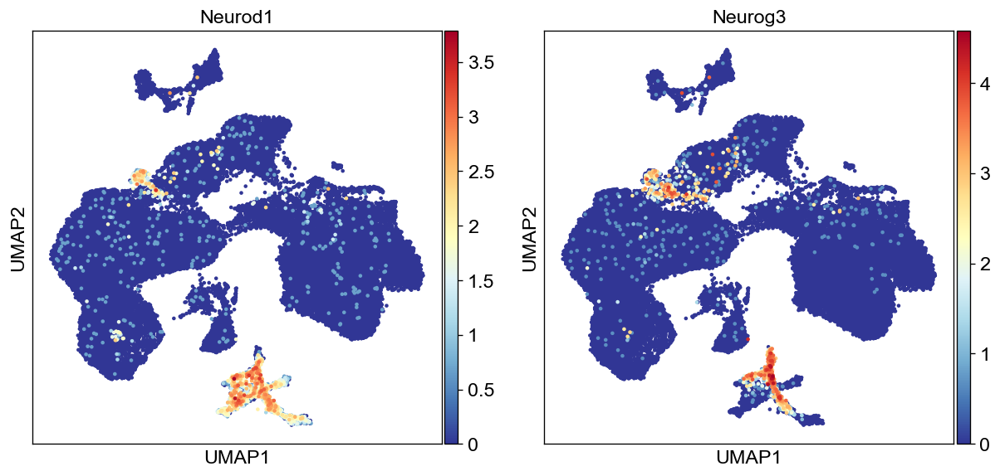

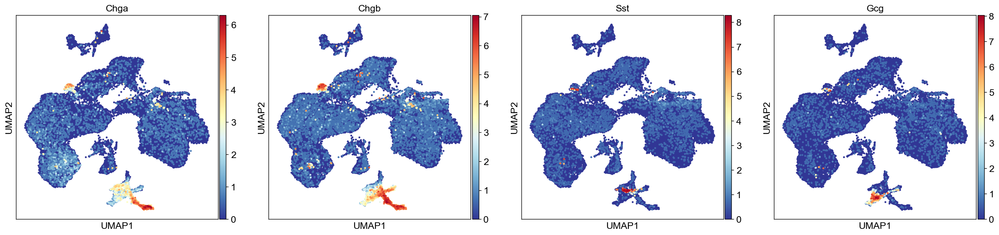

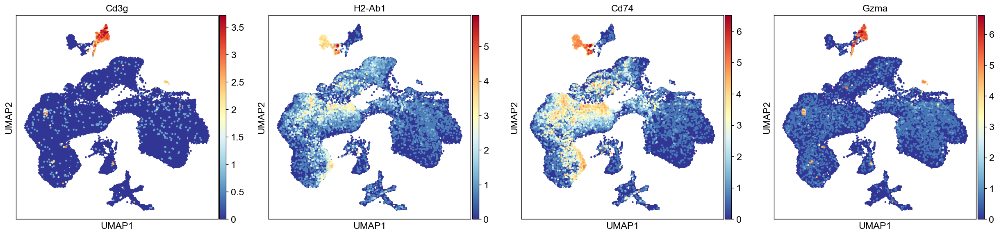

In [20]:
rcParams['figure.figsize']=(5,5)
sc.pl.umap(adata_ctrl, color=['Fabp1', 'Sis'], size=30)
sc.pl.umap(adata_ctrl, color=['Lyz1', 'Mmp7'], size=30)
sc.pl.umap(adata_ctrl, color=['Lgr5', 'Ascl2', 'Dclk1'], size=30)
sc.pl.umap(adata_ctrl, color=['Tff3', 'Muc2', 'Spdef', 'Sox4'], size=30)
sc.pl.umap(adata_ctrl, color=['Mki67', 'Aurka', 'Ccnd1'], size=30)
sc.pl.umap(adata_ctrl, color=['Neurod1', 'Neurog3'], size=30)
sc.pl.umap(adata_ctrl, color=[ 'Chga', 'Chgb', 'Sst', 'Gcg'], size=30)
sc.pl.umap(adata_ctrl, color=['Cd3g', 'H2-Ab1', 'Cd74', 'Gzma'], size=30)

# Cluster annotation 
Let us check on the identity of each cluster by differential gene expression tests

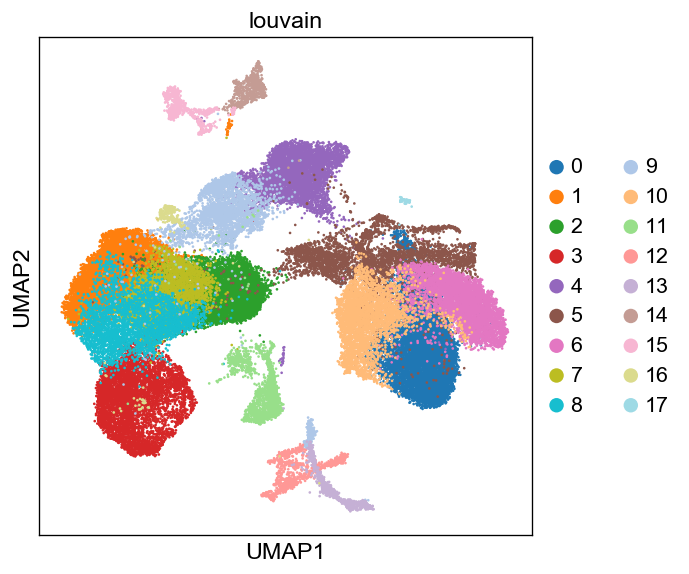

In [21]:
sc.pl.umap(adata_ctrl, color='louvain', size=10)

In [22]:
sc.tl.rank_genes_groups(adata_ctrl, groupby='louvain')

ranking genes
    finished (0:02:09.93) --> added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids


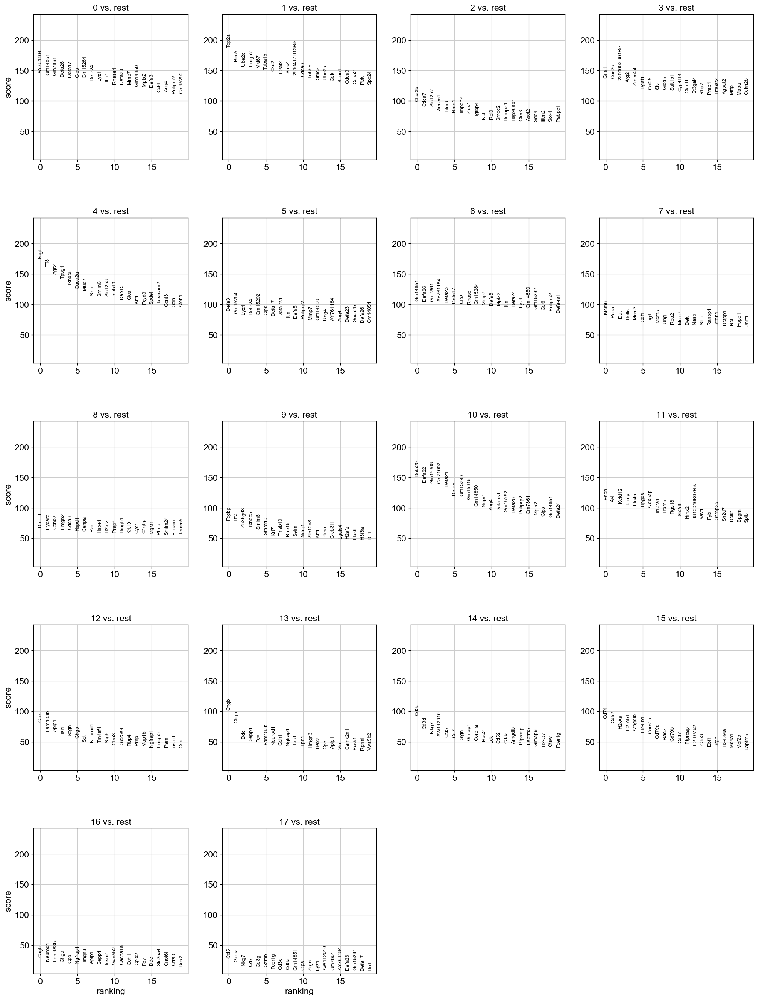

In [23]:
sc.pl.rank_genes_groups(adata_ctrl)

Examining the gene expression of the respective clusters, we identified three clusters with immun-function (**14**, **15** and **17**). Cluster 14 expresses e.g. *Cd3g* and *Cd3d* that compose parts of the T-cell receptor. Cluster 15 expresses e.g. *H2-Ab1*, *H2-Eb1* and *H2-Aa* that contribute to the MHC-II-complex, which is only present on immune cells. Cluster 17 expresses high values of *Gzma* and elevated levels of *Cd3g*.

Paneth cells show high expression of *Lyz1*, *Itln1* or *Defa* genes. 

Enteroendocrine cell cluster are high in *Chga* and *Chgb*. 

Transit amplifying cells have a wide range of cell-cycle markers and differentiation markers as *Top2a*, *Birc1* or *Ccnb2*. 

Intestinal stem cells express *Lgr5* as marker gene. 

Goblet cells are highes in *Fcgbp*, *Tff3*, or *Spdef*. 

Enterocytes express *Fabp1* as marker gene. 

Tuft cells are distinguished by *Dclk1* and *Avil* expression.

In [24]:
genes_to_xls(adata_ctrl, filename='./table/gut_AB_AL_first_clustering.xls')

Cluster annotation revealed the following cell types:

|Cluster | Cell type|
|------------------|
| 0 | Paneth |
| 1 | ISC |
| 2 | ISC |
| 3 | Enterocyte |
| 4 | Goblet |
| 5 | Paneth |
| 6 | Paneth |
| 7 | ISC |
| 8 | Enterocyte progenitor |
| 9 | Goblet |
| 10| Paneth |
| 11| Tuft |
| 12| EEC |
| 13| EEC |
| 14| Lymphocyte |
| 15| Lymphocyte |
| 16| EEC
| 17| Lymphocyte |

Create new variable to note cell types:

In [35]:
ECpro_cells = np.flatnonzero(np.in1d(adata_ctrl.obs['louvain'], [ '8']))
ISC = np.flatnonzero(np.in1d(adata_ctrl.obs['louvain'], ['1','2','7']))
Paneth = np.flatnonzero(np.in1d(adata_ctrl.obs['louvain'], ['0', '5','6', '10']))
Goblet = np.flatnonzero(np.in1d(adata_ctrl.obs['louvain'], ['4', '9']))
EC = np.flatnonzero(np.in1d(adata_ctrl.obs['louvain'], ['3']))
Tuft = np.flatnonzero(np.in1d(adata_ctrl.obs['louvain'],['11']))
immune = np.flatnonzero(np.in1d(adata_ctrl.obs['louvain'], ['14','15','17']))
EEC = np.flatnonzero(np.in1d(adata_ctrl.obs['louvain'],['12', '13', '16']))

In [36]:
label_cluster = pd.Series(data=np.concatenate([np.repeat('ISC', len(ISC)),
                                               np.repeat('Enterocyte', len(EC)),
                                               np.repeat('Paneth', len(Paneth)),
                                               np.repeat('Goblet', len(Goblet)),
                                               np.repeat('Tuft', len(Tuft)),
                                               np.repeat('EEC', len(EEC)),
                                               np.repeat('Enterocyte progenitor', len(ECpro_cells)),
                                               np.repeat('Lymphocyte', len(immune)),
                                              ]), 
                              index=np.concatenate([ISC,EC,Paneth,
                                                    Goblet, Tuft,EEC,ECpro_cells, immune]),
                              dtype='category'
                             ).sort_index()

In [37]:
adata_ctrl.obs['cell_type'] = label_cluster.values


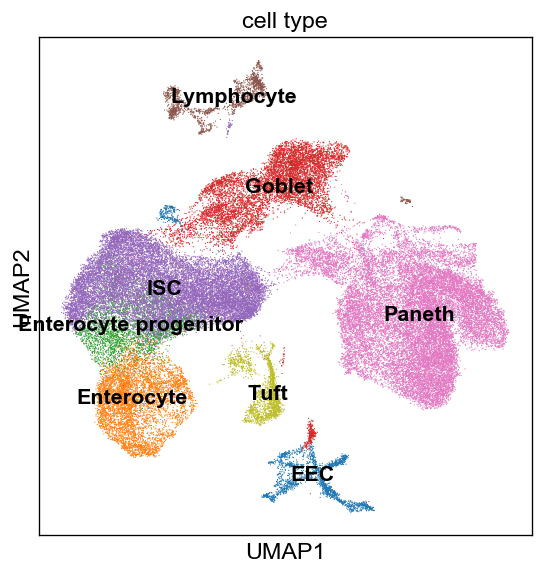

In [38]:
sc.pl.umap(adata_ctrl, color='cell_type', legend_loc='on data')


In summary, the coarse grained clustering reveals major cell types, but the borders between some cell types (for example EEC and Goblet cells) are not clear. Also, we aim to identify progenitor populations.

# Graph abstraction and lineage tree

In the first run, we keep the lymphocyte clusters in the data to see if they connect to the other clusters.

## With lymphocytes

### Louvain group-based tree 

Let us create a lineage tree for all control samples based on the original `louvain` groups.

In [39]:
sc.tl.paga(adata_ctrl)


running partition-based graph abstraction (PAGA)
    finished (0:00:05.20) --> added
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connectivities subtree (adata.uns)


--> added 'pos', the PAGA positions (adata.uns['paga'])


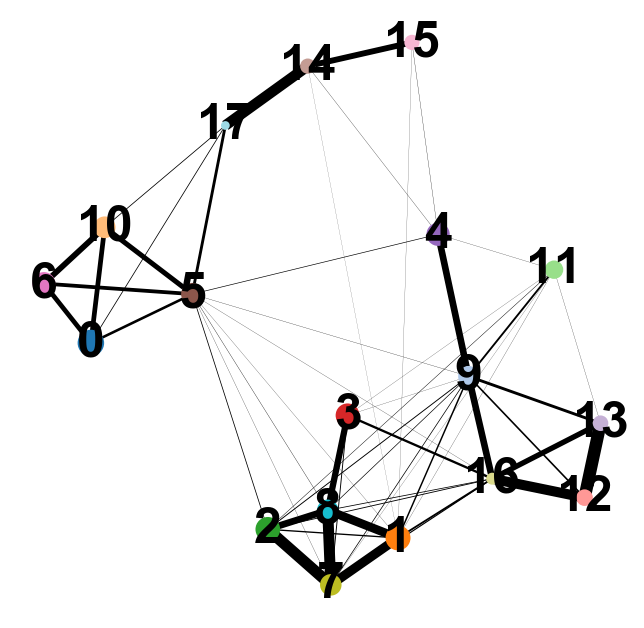

In [42]:
rcParams['figure.figsize'] = (6,6)
sc.pl.paga(adata_ctrl, 
          fontsize=30, frameon=False,
          edge_width_scale=1)


--> added 'pos', the PAGA positions (adata.uns['paga'])


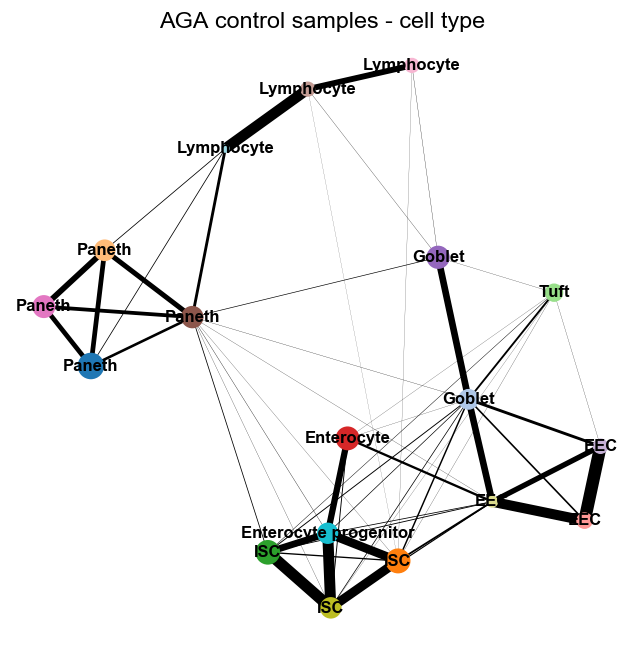

In [44]:
asso_names, asso_matrix = sc.utils.compute_association_matrix_of_groups(
    adata_ctrl, prediction='louvain', reference='cell_type')
asso_colors = sc.utils.get_associated_colors_of_groups(adata_ctrl.uns['louvain_colors'], asso_matrix)
sc.pl.paga(adata_ctrl, 
           title='AGA control samples - cell type',
                edge_width_scale=1, frameon=False,
                labels=asso_names,
           color=asso_colors,
                fontsize=10)


### Cell type-based tree

In [45]:
sc.tl.paga(adata_ctrl, groups='cell_type')


running partition-based graph abstraction (PAGA)
    finished (0:00:03.07) --> added
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connectivities subtree (adata.uns)


--> added 'pos', the PAGA positions (adata.uns['paga'])


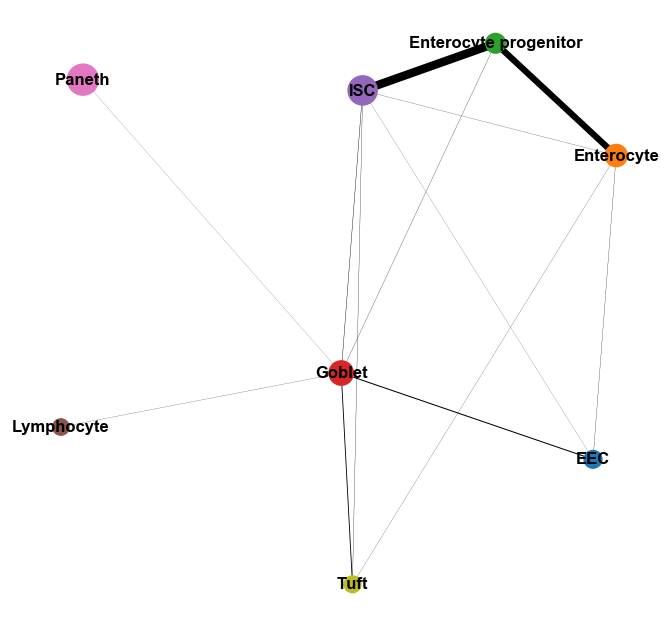

In [46]:
sc.pl.paga(adata_ctrl,fontsize=10, frameon=False,
          edge_width_scale=1)


--> added 'pos', the PAGA positions (adata.uns['paga'])


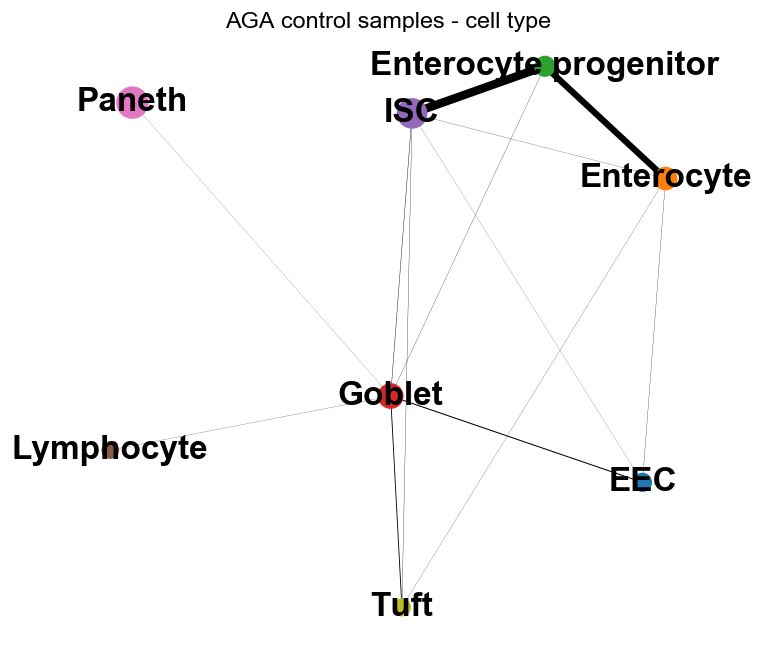

In [48]:
asso_names, asso_matrix = sc.utils.compute_association_matrix_of_groups(
    adata_ctrl, prediction='cell_type', reference='cell_type')
asso_colors = sc.utils.get_associated_colors_of_groups(adata_ctrl.uns['louvain_colors'], asso_matrix)

sc.pl.paga(adata_ctrl, 
                title='AGA control samples - cell type',
               edge_width_scale=1,
                labels=asso_names,
                fontsize=20, frameon=False
               )

## Without lymphocytes

For subsequent analyses, we remove lymphocytes from the data.

In [51]:
lymphocytes = np.in1d(adata_ctrl.obs['cell_type'], ['Lymphocyte'])
a_woly = adata_ctrl[np.invert(lymphocytes),:]


In [52]:
a_woly

View of AnnData object with n_obs × n_vars = 58375 × 1999 
    obs: 'sample', 'percent_mito', 'percent_ribo', 'n_counts', 'n_genes', 'genetics', 'louvain', 'S_score', 'G2M_score', 'phase', 'cell_type'
    var: 'mean', 'dispersion'
    uns: 'neighbors', 'pca', 'sample_colors', 'louvain', 'louvain_colors', 'phase_colors', 'rank_genes_groups', 'cell_type_colors', 'paga', 'louvain_sizes', 'cell_type_sizes'
    obsm: 'X_pca', 'X_umap', 'X_tsne'
    varm: 'PCs'

### Louvain-group based tree

We have to recompute the PCA parameter as they still contain the information of the lymphocyte clusters.

#### All samples

In [53]:
sc.tl.pca(a_woly)


Note that scikit-learn's randomized PCA might not be exactly reproducible across different computational platforms. For exact reproducibility, choose `svd_solver='arpack'.` This will likely become the Scanpy default in the future.


In [54]:
sc.tl.paga(a_woly, groups='louvain')

running partition-based graph abstraction (PAGA)
    finished (0:00:04.32) --> added
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connectivities subtree (adata.uns)


In [55]:
sc.pp.neighbors(a_woly)
sc.tl.umap(a_woly)

computing neighbors
    using 'X_pca' with n_pcs = 50
    finished (0:00:23.88) --> added to `.uns['neighbors']`
    'distances', weighted adjacency matrix
    'connectivities', weighted adjacency matrix
computing UMAP
    finished (0:00:56.08) --> added
    'X_umap', UMAP coordinates (adata.obsm)


exporting label positions to ./write/pos.csv


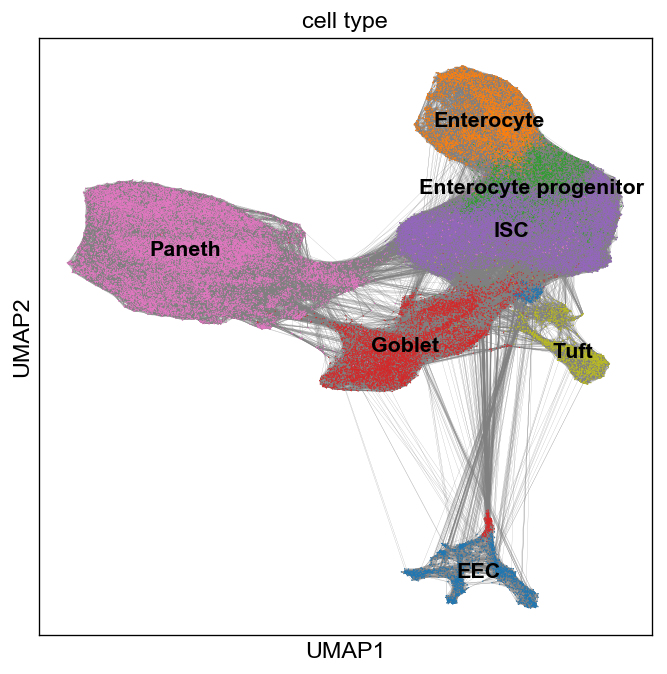

In [56]:
sc.pl.umap(a_woly, color='cell_type', legend_loc='on data export', edges=True)


--> added 'pos', the PAGA positions (adata.uns['paga'])


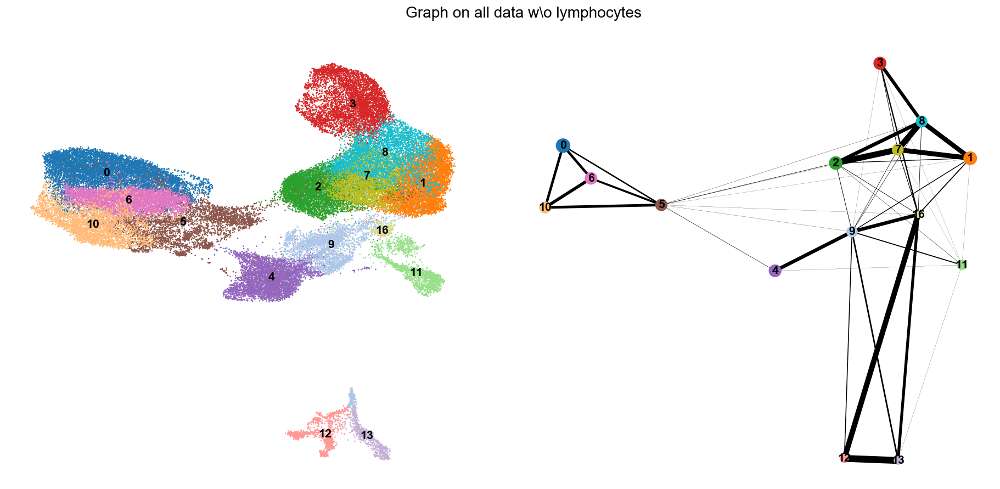

In [59]:
rcParams['figure.figsize'] = (8, 8)
sc.pl.paga_compare(a_woly, size=10,
                   title='Graph on all data w\o lymphocytes', frameon=False, basis='umap',
         edge_width_scale=1)#, pos=np.loadtxt('write/pos.csv', delimiter=','))


--> added 'pos', the PAGA positions (adata.uns['paga'])


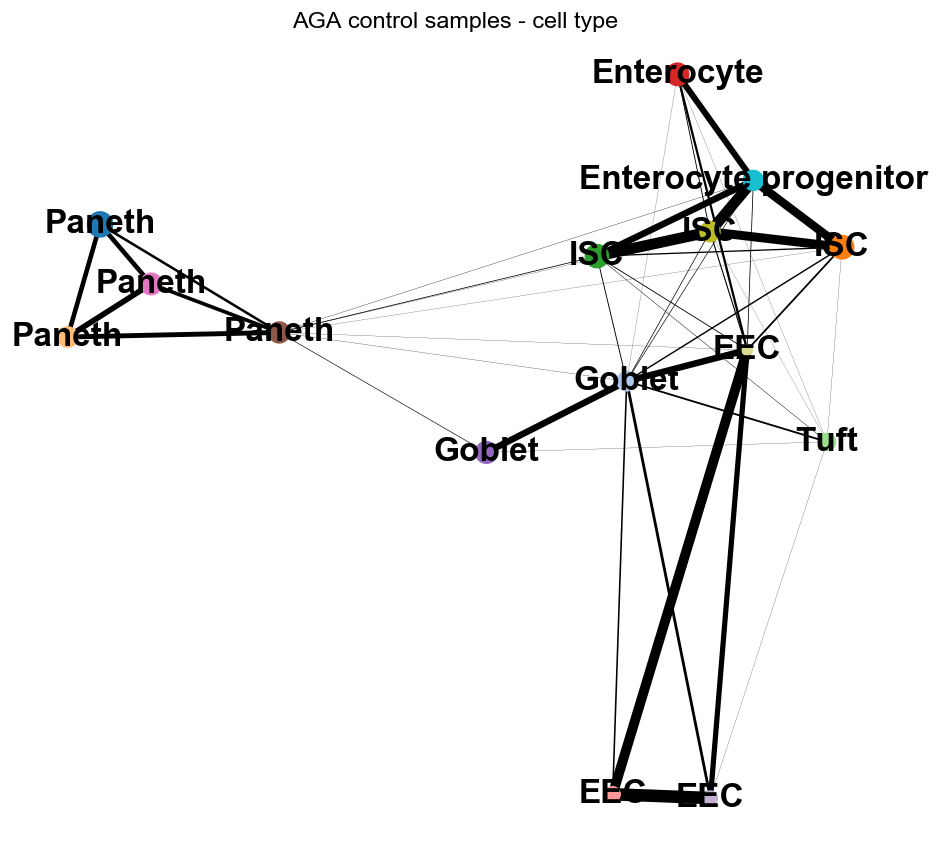

In [58]:
asso_names, asso_matrix = sc.utils.compute_association_matrix_of_groups(
    a_woly, prediction='louvain', reference='cell_type')
sc.pl.paga(a_woly, pos=a_woly.uns['paga']['pos'],
           title='AGA control samples - cell type',
           root=10,edge_width_scale=1,
           labels=asso_names, 
           fontsize=20, frameon=False
           )


## Summary

Based on the coarse-grained clustering, we cannot find significant connections for several clusters. Let us focus on a more fine-grained clustering that distinguishes progenitor cells and mature differentiated populations. 

Save results to file and start a thorough study of sub-cell types in the next notebook.

In [60]:
adata_ctrl

AnnData object with n_obs × n_vars = 59964 × 1999 
    obs: 'sample', 'percent_mito', 'percent_ribo', 'n_counts', 'n_genes', 'genetics', 'louvain', 'S_score', 'G2M_score', 'phase', 'cell_type'
    var: 'mean', 'dispersion'
    uns: 'neighbors', 'pca', 'sample_colors', 'louvain', 'louvain_colors', 'phase_colors', 'rank_genes_groups', 'cell_type_colors', 'paga', 'louvain_sizes', 'cell_type_sizes'
    obsm: 'X_pca', 'X_umap', 'X_tsne'
    varm: 'PCs'

In [61]:
sc.write(adata=adata_ctrl, filename='./write/gut_AB_AL_log_cor_ctrl.h5ad')


# Check ISC-Paneth-EEC-Goblet lineage

This analysis is carried out in a new notebook.